In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Pytorch-Models
!ls

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
ln: failed to create symbolic link '/mydrive/My Drive': File exists
/content/gdrive/My Drive/Pytorch-Models
checkpoints_unetpp_suim  FasterRCNN-det.ipynb  sam_vit_b_01ec64.pth  utils.py
coco_eval.py		 MaskRCNN-Seg.ipynb    SSD-det.ipynb	     vision
coco_utils.py		 __pycache__	       test
datasets		 requirements.txt      transforms.py
engine.py		 SAM.ipynb	       UNet++_Seg.ipynb


In [ ]:
import os
import json

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/SUIM/train_val/images")
count_images("datasets/SUIM/train_val/masks")
count_images("datasets/SUIM/test/images")
count_images("datasets/SUIM/test/masks")

Total images: 1525
Total images: 1525
Total images: 110
Total images: 110


In [ ]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm

mask_dir = "datasets/SUIM/train_val/masks"

image_class_presence = {}

valid_classes = set(range(8))  # Classes 0 to 7 only

for mask_filename in tqdm(os.listdir(mask_dir)):
    mask_path = os.path.join(mask_dir, mask_filename)
    mask = np.array(Image.open(mask_path))
    unique_classes = np.unique(mask)

    # Filter out ignore label (255) and unexpected classes
    filtered_classes = set([cls for cls in unique_classes if cls in valid_classes])

    image_class_presence[mask_filename] = filtered_classes

# Class occurrence count (only for classes 0-7)
class_occurrence = {i: 0 for i in range(8)}
for classes in image_class_presence.values():
    for cls in classes:
        class_occurrence[cls] += 1

print("\nPer-class image occurrence count (from 1525 images):")
for cls, count in class_occurrence.items():
    print(f"Class {cls}: {count} images")

100%|██████████| 1525/1525 [00:29<00:00, 51.60it/s]


Per-class image occurrence count (from 1525 images):
Class 0: 1525 images
Class 1: 85 images
Class 2: 85 images
Class 3: 85 images
Class 4: 85 images
Class 5: 85 images
Class 6: 85 images
Class 7: 85 images


In [ ]:
import os
import numpy as np
from PIL import Image
from tqdm import tqdm
import random
import json

mask_dir = "datasets/SUIM/train_val/masks"
output_json_path = "datasets/SUIM/splits/suim_80_20_split.json"

os.makedirs(os.path.dirname(output_json_path), exist_ok=True)

valid_classes = set(range(8))  # Classes 0-7

# Step 1: Gather class presence per image
image_class_presence = {}

for mask_filename in tqdm(os.listdir(mask_dir)):
    mask_path = os.path.join(mask_dir, mask_filename)
    mask = np.array(Image.open(mask_path))
    unique_classes = np.unique(mask)
    filtered_classes = set([cls for cls in unique_classes if cls in valid_classes])
    image_class_presence[mask_filename] = filtered_classes

# Step 2: For each class 1-7, get image list
class_to_images = {cls: [] for cls in range(1, 8)}

for img_name, classes in image_class_presence.items():
    for cls in classes:
        if cls != 0:
            class_to_images[cls].append(img_name)

# Step 3: Ensure each class 1-7 appears in val set (at least ~15-20 images)
val_images = set()
required_val_per_class = 17  # Target ~20% from 85

for cls in range(1, 8):
    images_for_cls = class_to_images[cls]
    selected_for_val = random.sample(images_for_cls, required_val_per_class)
    val_images.update(selected_for_val)

# Step 4: Fill remaining val images up to total 20% (~305 images)
all_images = list(image_class_presence.keys())
remaining_images = list(set(all_images) - val_images)

total_val_target = int(0.2 * len(all_images))
additional_needed = total_val_target - len(val_images)

if additional_needed > 0:
    val_images.update(random.sample(remaining_images, additional_needed))

# Step 5: Final train/val lists
val_images = list(val_images)
train_images = list(set(all_images) - set(val_images))

print(f"Total train images: {len(train_images)}")
print(f"Total val images: {len(val_images)}")

# Step 6: Save to JSON
split_dict = {
    "train": sorted(train_images),
    "val": sorted(val_images)
}

with open(output_json_path, "w") as f:
    json.dump(split_dict, f, indent=4)

print(f"✅ Saved split JSON to: {output_json_path}")

100%|██████████| 1525/1525 [00:36<00:00, 41.99it/s]

Total train images: 1220
Total val images: 305
✅ Saved split JSON to: datasets/SUIM/splits/suim_80_20_split.json


In [ ]:
import json
import os
from PIL import Image
import numpy as np

split_json_path = "datasets/SUIM/splits/suim_80_20_split.json"
mask_dir = "datasets/SUIM/train_val/masks"

# Load split
with open(split_json_path, "r") as f:
    split = json.load(f)

train_list = split["train"]
val_list = split["val"]

valid_classes = set(range(8))  # Only 0 to 7

def get_class_presence(image_list):
    class_set = set()
    for img_name in image_list:
        mask_path = os.path.join(mask_dir, img_name)
        mask = np.array(Image.open(mask_path))
        unique_classes = np.unique(mask)
        for cls in unique_classes:
            if cls in valid_classes:
                class_set.add(cls)
    return class_set

print(f"Train images: {len(train_list)}")
print(f"Val images: {len(val_list)}")

print("\nChecking class presence (only classes 0-7)...")

train_classes = get_class_presence(train_list)
val_classes = get_class_presence(val_list)

print(f"Train classes: {sorted(train_classes)}")
print(f"Val classes: {sorted(val_classes)}")

Train images: 1220
Val images: 305

Checking class presence (only classes 0-7)...
Train classes: [np.uint8(0), np.uint8(1), np.uint8(2), np.uint8(3), np.uint8(4), np.uint8(5), np.uint8(6), np.uint8(7)]
Val classes: [np.uint8(0), np.uint8(1), np.uint8(2), np.uint8(3), np.uint8(4), np.uint8(5), np.uint8(6), np.uint8(7)]


In [2]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [ ]:
!pip install segmentation-models-pytorch albumentations

In [ ]:
!pip install timm

In [5]:
import os
import json
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from segmentation_models_pytorch.utils import losses, metrics

In [157]:
# Define augmentations
def get_training_augmentations():
    return A.Compose([
        A.Resize(512, 512),

        # Geometric transforms
        A.HorizontalFlip(p=0.5),
        # Color and noise
        A.RandomBrightnessContrast(p=0.3),
        A.RandomGamma(p=0.3),
        A.GaussianBlur(p=0.2),

        # Normalize for ImageNet
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(transpose_mask=True),
    ])

def get_validation_augmentations():
    return A.Compose([
        A.Resize(512, 512),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(transpose_mask=True)  # Ensure mask stays (H,W) and gets converted
    ])

# Define your RGB-to-class mapping (adjust exact RGB values if needed)
COLOR_TO_CLASS = {
    (0, 0, 0): 0,         # Background (BW)
    (0, 0, 255): 1,       # Human divers (HD)
    (0, 255, 0): 2,       # Aquatic plants and sea-grass (PF)
    (0, 255, 255): 3,     # Wrecks or ruins (WR)
    (255, 0, 0): 4,       # Robots (RO)
    (255, 0, 255): 5,     # Reefs and invertebrates (RI)
    (255, 255, 0): 6,     # Fish and vertebrates (FV)
    (255, 255, 255): 7    # Sea-floor and rocks (SR)
}

def rgb_to_class(mask_rgb):
    h, w, _ = mask_rgb.shape
    class_mask = np.zeros((h, w), dtype=np.uint8)

    for rgb, class_idx in COLOR_TO_CLASS.items():
        matches = np.all(mask_rgb == rgb, axis=-1)
        class_mask[matches] = class_idx

    return class_mask

class SUIMDataset(Dataset):
    def __init__(self, images_dir, masks_dir, split_json_path=None, split=None, transform=None):
        import json
        import os

        self.transform = transform
        self.images_dir = images_dir
        self.masks_dir = masks_dir

        if split_json_path and split:
            with open(split_json_path, 'r') as f:
                split_data = json.load(f)
            self.image_filenames = split_data[split]
        else:
            # If no split json, use all images in images_dir
            self.image_filenames = sorted(os.listdir(images_dir))

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_name = self.image_filenames[idx]
        base_name = os.path.splitext(img_name)[0]

        img_path = os.path.join(self.images_dir, base_name + ".jpg")
        mask_path = os.path.join(self.masks_dir, base_name + ".bmp")

        image = np.array(Image.open(img_path).convert("RGB"))
        mask_rgb = np.array(Image.open(mask_path).convert("RGB"))

        # Convert RGB mask to class index mask
        mask = rgb_to_class(mask_rgb)

        # Optionally resize mask if needed (match image size)
        if image.shape[:2] != mask.shape[:2]:
            mask = np.array(Image.fromarray(mask).resize((image.shape[1], image.shape[0]), resample=Image.NEAREST))

        # Apply augmentations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # Convert image to tensor if needed
        if not isinstance(image, torch.Tensor):
            image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0

        # Convert mask to long tensor
        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(mask)

        mask = mask.long()

        return image, mask

In [159]:
train_dataset = SUIMDataset(
    images_dir="datasets/SUIM/train_val/images",
    masks_dir="datasets/SUIM/train_val/masks",
    split_json_path="datasets/SUIM/splits/suim_80_20_split.json",
    split="train",
    transform=get_training_augmentations()
)

val_dataset = SUIMDataset(
    images_dir="datasets/SUIM/train_val/images",
    masks_dir="datasets/SUIM/train_val/masks",
    split_json_path="datasets/SUIM/splits/suim_80_20_split.json",
    split="val",
    transform=get_validation_augmentations()
)

In [160]:
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

CLASS_NAMES = {
    0: "Background (BW)",
    1: "Human divers (HD)",
    2: "Aquatic plants (PF)",
    3: "Wrecks/Ruins (WR)",
    4: "Robots (RO)",
    5: "Reefs/Invertebrates (RI)",
    6: "Fish/Vertebrates (FV)",
    7: "Sea-floor/Rocks (SR)"
}

CLASS_COLORS = np.array([
    [0, 0, 0],         # 0: Background (BW)
    [0, 0, 255],       # 1: Human divers (HD)
    [0, 255, 0],       # 2: Aquatic plants (PF)
    [0, 255, 255],     # 3: Wrecks/Ruins (WR)
    [255, 0, 0],       # 4: Robots (RO)
    [255, 0, 255],     # 5: Reefs/Invertebrates (RI)
    [255, 255, 0],     # 6: Fish/Vertebrates (FV)
    [255, 255, 255]    # 7: Sea-floor/Rocks (SR)
], dtype=np.uint8)

def unnormalize(image_tensor):
    """Unnormalize ImageNet-normalized tensors back to [0,1] numpy for display."""
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * IMAGENET_STD) + IMAGENET_MEAN
    image_np = np.clip(image_np, 0, 1)
    return image_np

def decode_mask(mask_np):
    """Convert class index mask to SUIM RGB color mask."""
    h, w = mask_np.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_idx in range(len(CLASS_COLORS)):
        color_mask[mask_np == class_idx] = CLASS_COLORS[class_idx]
    return color_mask

def visualize_two_samples(dataset, idx1, idx2):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    for i, idx in enumerate([idx1, idx2]):
        image, mask = dataset[idx]

        # Unnormalize image
        image_np = unnormalize(image)

        # Decode mask
        mask_np = mask.cpu().numpy()
        color_mask = decode_mask(mask_np)

        # Print unique classes
        unique_classes = np.unique(mask_np)
        print(f"\nSample {idx} contains classes:")
        for c in unique_classes:
            class_name = CLASS_NAMES.get(c, f"Class {c}")
            print(f"  - ID {c}: {class_name}")

        # Plot image and mask
        axs[i * 2].imshow(image_np)
        axs[i * 2].set_title(f"Image {idx}")
        axs[i * 2].axis('off')

        axs[i * 2 + 1].imshow(color_mask)
        axs[i * 2 + 1].set_title(f"GT Mask {idx}")
        axs[i * 2 + 1].axis('off')

    plt.tight_layout()
    plt.show()


Sample 44 contains classes:
  - ID 0: Background (BW)
  - ID 5: Reefs/Invertebrates (RI)
  - ID 6: Fish/Vertebrates (FV)

Sample 125 contains classes:
  - ID 0: Background (BW)
  - ID 1: Human divers (HD)
  - ID 6: Fish/Vertebrates (FV)
  - ID 7: Sea-floor/Rocks (SR)


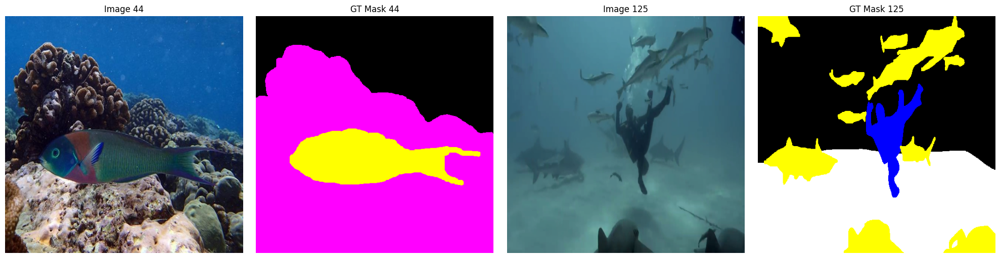

In [161]:
visualize_two_samples(train_dataset, 44, 125)

In [163]:
BATCH_SIZE = 8  # adjust based on your GPU memory

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

In [164]:
# === Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = smp.UnetPlusPlus(
    encoder_name="timm-efficientnet-b4",
    encoder_weights="imagenet",
    in_channels=3,
    classes=8,
    activation=None
).to(device)
model = model.to(device)

In [ ]:
!pip install torchmetrics

In [165]:
dice_loss = smp.losses.DiceLoss(mode='multiclass', ignore_index=255)
ce_loss = nn.CrossEntropyLoss(ignore_index=255)

def combined_loss(preds, targets):
    return dice_loss(preds, targets) + ce_loss(preds, targets)

In [166]:
# === Loss ===
#criterion = nn.CrossEntropyLoss(ignore_index=255)

# === Optimizer ===
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# === LR Scheduler ===
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, verbose=True)

# === Metric calculation ===
import torch
from torchmetrics.classification import MulticlassJaccardIndex, MulticlassF1Score

# Initialize metrics (once, outside training loop)
iou_metric = MulticlassJaccardIndex(num_classes=8, ignore_index=255, average='macro')
dice_metric = MulticlassF1Score(num_classes=8, ignore_index=255, average='macro')

def calculate_metrics(outputs, masks):
    preds = torch.argmax(outputs, dim=1)  # Convert logits to class indices
    iou = iou_metric(preds.cpu(), masks.cpu())
    dice = dice_metric(preds.cpu(), masks.cpu())
    return dice.item(), iou.item()

In [167]:
# === Training + Validation Loop ===
#best_iou = 0.0
#NUM_EPOCHS = 30
os.makedirs("checkpoints_unetpp_suim", exist_ok=True)

# Load best checkpoint
model.load_state_dict(torch.load("checkpoints_unetpp_suim/best_model.pth"))
# Re-initialize optimizer (fresh one, with lower LR)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, verbose=True, min_lr=1e-6)
best_iou = 0.4272
NUM_EPOCHS = 20

for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss = 0.0

    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = combined_loss(outputs, masks)
        #criterion = ComboLoss(num_classes=8, tversky_weight=0.5, focal_weight=0.5, alpha=0.5, beta=0.5, gamma=2.0)
        # Then during training:
        #loss = criterion(outputs, masks)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_loss += loss.item() * images.size(0)

    train_loss /= len(train_loader.dataset)

    # === Validation ===
    model.eval()
    val_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0

    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = combined_loss(outputs, masks)
            #criterion = ComboLoss(num_classes=8, tversky_weight=0.5, focal_weight=0.5, alpha=0.5, beta=0.5, gamma=2.0)
            # Then during training:
            #loss = criterion(outputs, masks)
            dice, iou = calculate_metrics(outputs, masks)
            val_loss += loss.item() * images.size(0)
            total_dice += dice * images.size(0)
            total_iou += iou * images.size(0)

    val_loss /= len(val_loader.dataset)
    avg_dice = total_dice / len(val_loader.dataset)
    avg_iou = total_iou / len(val_loader.dataset)

    print(f"[Epoch {epoch+1}/{NUM_EPOCHS}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Dice: {avg_dice:.4f} | Val IoU: {avg_iou:.4f}")

    scheduler.step(avg_iou)

    # Save best model by IoU
    if avg_iou > best_iou:
        best_iou = avg_iou
        torch.save(model.state_dict(), "checkpoints_unetpp_suim/best_model50.pth")
        print(f"✅ Saved new best model (Val IoU: {best_iou:.4f})")

print(f"\n🏅 Finished Training. Best Val IoU: {best_iou:.4f}")

[Epoch 1/20] Train Loss: 0.2601 | Val Loss: 1.2139 | Val Dice: 0.4997 | Val IoU: 0.4182
[Epoch 2/20] Train Loss: 0.2394 | Val Loss: 1.2160 | Val Dice: 0.5074 | Val IoU: 0.4243
[Epoch 3/20] Train Loss: 0.2443 | Val Loss: 1.2250 | Val Dice: 0.5209 | Val IoU: 0.4351
✅ Saved new best model (Val IoU: 0.4351)
[Epoch 4/20] Train Loss: 0.2444 | Val Loss: 1.2597 | Val Dice: 0.5170 | Val IoU: 0.4315
[Epoch 5/20] Train Loss: 0.2448 | Val Loss: 1.2400 | Val Dice: 0.5140 | Val IoU: 0.4303
[Epoch 6/20] Train Loss: 0.2342 | Val Loss: 1.2642 | Val Dice: 0.5179 | Val IoU: 0.4331
[Epoch 7/20] Train Loss: 0.2312 | Val Loss: 1.2726 | Val Dice: 0.5086 | Val IoU: 0.4253
[Epoch 8/20] Train Loss: 0.2267 | Val Loss: 1.2290 | Val Dice: 0.5201 | Val IoU: 0.4350
[Epoch 9/20] Train Loss: 0.2255 | Val Loss: 1.2522 | Val Dice: 0.5128 | Val IoU: 0.4288
[Epoch 10/20] Train Loss: 0.2226 | Val Loss: 1.2440 | Val Dice: 0.5144 | Val IoU: 0.4311
[Epoch 11/20] Train Loss: 0.2285 | Val Loss: 1.2518 | Val Dice: 0.5159 | Val I

In [173]:
import torch

model = smp.UnetPlusPlus(
    encoder_name="timm-efficientnet-b4",
    encoder_weights=None,
    in_channels=3,
    classes=8,
    activation=None
).to(device)
model.load_state_dict(torch.load("checkpoints_unetpp_suim/best_model50.pth"))
model = model.to(device)
model.eval()

UnetPlusPlus(
  (encoder): EfficientNetEncoder(
    (conv_stem): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): Swish()
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
          (bn1): BatchNormAct2d(
            48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): Swish()
          )
          (aa): Identity()
          (se): SqueezeExcite(
            (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (act1): Swish()
            (conv_expand): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (gate): Sigmoid()
          )
          (conv_pw): Conv2d(48, 24, kernel_siz

In [174]:
train_dataset = SUIMDataset(
    images_dir="datasets/SUIM/train_val/images",
    masks_dir="datasets/SUIM/train_val/masks",
    split_json_path="datasets/SUIM/splits/suim_80_20_split.json",
    split="train",
    transform=get_training_augmentations()
)

test_dataset = SUIMDataset(
    images_dir="datasets/SUIM/test/images",
    masks_dir="datasets/SUIM/test/masks",
    split_json_path=None,
    split=None,
    transform=get_validation_augmentations()
)

In [175]:
BATCH_SIZE = 8  # adjust based on your GPU memory

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

In [176]:
val_loss = 0.0
total_dice = 0.0
total_iou = 0.0
iou_metric.reset()
dice_metric.reset()

with torch.no_grad():
  for images, masks in test_loader:
      images, masks = images.to(device), masks.to(device)
      outputs = model(images)
      #criterion = ComboLoss(num_classes=8, tversky_weight=0.5, focal_weight=0.5, alpha=0.5, beta=0.5, gamma=2.0)
      #loss = criterion(outputs, masks)
      loss = combined_loss(outputs, masks)
      dice, iou = calculate_metrics(outputs, masks)
      val_loss += loss.item() * images.size(0)
      total_dice += dice * images.size(0)
      total_iou += iou * images.size(0)

val_loss /= len(test_loader.dataset)
avg_test_dice = total_dice / len(test_loader.dataset)
avg_test_iou = total_iou / len(test_loader.dataset)

print(f"\n📊 Test Set Result => Loss: {val_loss:.4f} | Dice: {avg_test_dice:.4f} | IoU: {avg_test_iou:.4f}")


📊 Test Set Result => Loss: 0.7295 | Dice: 0.6308 | IoU: 0.5490


In [177]:
# 30 epochs
# 📊 Test Set Result => Loss: 0.7084 | Dice: 0.5991 | IoU: 0.5271

In [178]:
from torchmetrics.classification import (
    MulticlassJaccardIndex,
    MulticlassF1Score,
    MulticlassPrecision,
    MulticlassRecall
)

NUM_CLASSES = 8  # SUIM has 8 classes (0-7)

# Define metrics
per_class_iou_metric = MulticlassJaccardIndex(num_classes=NUM_CLASSES, ignore_index=255, average=None).to(device)
per_class_dice_metric = MulticlassF1Score(num_classes=NUM_CLASSES, ignore_index=255, average=None).to(device)
per_class_precision_metric = MulticlassPrecision(num_classes=NUM_CLASSES, ignore_index=255, average=None).to(device)
per_class_recall_metric = MulticlassRecall(num_classes=NUM_CLASSES, ignore_index=255, average=None).to(device)

model.eval()
all_preds = []
all_targets = []
val_loss = 0.0
total_samples = 0

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = combined_loss(outputs, masks)

        val_loss += loss.item() * images.size(0)
        total_samples += images.size(0)

        preds = torch.argmax(outputs, dim=1)
        all_preds.append(preds.cpu())
        all_targets.append(masks.cpu())

val_loss /= total_samples

all_preds_tensor = torch.cat(all_preds, dim=0).to(device)
all_targets_tensor = torch.cat(all_targets, dim=0).to(device)

# Compute metrics
per_class_iou = per_class_iou_metric(all_preds_tensor, all_targets_tensor).cpu().numpy()
per_class_dice = per_class_dice_metric(all_preds_tensor, all_targets_tensor).cpu().numpy()
per_class_precision = per_class_precision_metric(all_preds_tensor, all_targets_tensor).cpu().numpy()
per_class_recall = per_class_recall_metric(all_preds_tensor, all_targets_tensor).cpu().numpy()

# ---- Print results ----
print(f"\n📉 Validation Loss: {val_loss:.4f}\n")

print("📊 Per-Class IoU:")
for c in range(NUM_CLASSES):
    # Split class name and abbreviation if in format: "Name (ABBR)"
    full_name = CLASS_NAMES.get(c, f"Class {c}")
    # Try to align using max lengths
    # Find parentheses and align accordingly
    if "(" in full_name and ")" in full_name:
        name, abbr = full_name.split("(")
        abbr = abbr.strip(") ")
        print(f"{name.strip():<20}({abbr:<2}): IoU = {per_class_iou[c]:.4f}")
    else:
        print(f"{full_name:<25}: IoU = {per_class_iou[c]:.4f}")

print("\n📊 Per-Class Metrics:")
for c in range(NUM_CLASSES):
    full_name = CLASS_NAMES.get(c, f"Class {c}")
    precision = per_class_precision[c]
    recall = per_class_recall[c]
    f1 = per_class_dice[c]

    if "(" in full_name and ")" in full_name:
        name, abbr = full_name.split("(")
        abbr = abbr.strip(") ")
        print(
            f"{name.strip():<20}({abbr:<2}): "
            f"Precision = {precision:.4f}, Recall = {recall:.4f}, F1 = {f1:.4f}"
        )
    else:
        print(
            f"{full_name:<25}: "
            f"Precision = {precision:.4f}, Recall = {recall:.4f}, F1 = {f1:.4f}"
        )


📉 Validation Loss: 0.7295

📊 Per-Class IoU:
Background          (BW): IoU = 0.9123
Human divers        (HD): IoU = 0.8299
Aquatic plants      (PF): IoU = 0.3706
Wrecks/Ruins        (WR): IoU = 0.7132
Robots              (RO): IoU = 0.7146
Reefs/Invertebrates (RI): IoU = 0.6631
Fish/Vertebrates    (FV): IoU = 0.8233
Sea-floor/Rocks     (SR): IoU = 0.6832

📊 Per-Class Metrics:
Background          (BW): Precision = 0.9459, Recall = 0.9625, F1 = 0.9541
Human divers        (HD): Precision = 0.8999, Recall = 0.9143, F1 = 0.9071
Aquatic plants      (PF): Precision = 0.7026, Recall = 0.4396, F1 = 0.5408
Wrecks/Ruins        (WR): Precision = 0.8905, Recall = 0.7818, F1 = 0.8326
Robots              (RO): Precision = 0.8664, Recall = 0.8031, F1 = 0.8336
Reefs/Invertebrates (RI): Precision = 0.7755, Recall = 0.8206, F1 = 0.7974
Fish/Vertebrates    (FV): Precision = 0.9152, Recall = 0.8913, F1 = 0.9031
Sea-floor/Rocks     (SR): Precision = 0.7952, Recall = 0.8290, F1 = 0.8118


In [ ]:
# 30 epochs
'''📉 Validation Loss: 0.7084

📊 Per-Class IoU:
Background          (BW): IoU = 0.9031
Human divers        (HD): IoU = 0.8115
Aquatic plants      (PF): IoU = 0.3988
Wrecks/Ruins        (WR): IoU = 0.7092
Robots              (RO): IoU = 0.6823
Reefs/Invertebrates (RI): IoU = 0.6415
Fish/Vertebrates    (FV): IoU = 0.8116
Sea-floor/Rocks     (SR): IoU = 0.6681

📊 Per-Class Metrics:
Background          (BW): Precision = 0.9331, Recall = 0.9657, F1 = 0.9491
Human divers        (HD): Precision = 0.8673, Recall = 0.9265, F1 = 0.8960
Aquatic plants      (PF): Precision = 0.7143, Recall = 0.4745, F1 = 0.5702
Wrecks/Ruins        (WR): Precision = 0.8649, Recall = 0.7976, F1 = 0.8299
Robots              (RO): Precision = 0.8433, Recall = 0.7813, F1 = 0.8111
Reefs/Invertebrates (RI): Precision = 0.7954, Recall = 0.7683, F1 = 0.7816
Fish/Vertebrates    (FV): Precision = 0.9130, Recall = 0.8796, F1 = 0.8960
Sea-floor/Rocks     (SR): Precision = 0.7754, Recall = 0.8284, F1 = 0.8011
'''

In [180]:
import numpy as np

all_labels = []
for _, masks in test_loader:
    all_labels.append(masks.cpu().numpy())
all_labels = np.concatenate(all_labels).ravel()
print("Unique labels in test masks:", np.unique(all_labels))

Unique labels in test masks: [0 1 2 3 4 5 6 7]


In [183]:
oldmodel = smp.UnetPlusPlus(
    encoder_name="timm-efficientnet-b4",
    encoder_weights=None,
    in_channels=3,
    classes=8,
    activation=None
).to(device)
oldmodel.load_state_dict(torch.load("checkpoints_unetpp_suim/best_model.pth"))
oldmodel = oldmodel.to(device)
oldmodel.eval()

UnetPlusPlus(
  (encoder): EfficientNetEncoder(
    (conv_stem): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): Swish()
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
          (bn1): BatchNormAct2d(
            48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): Swish()
          )
          (aa): Identity()
          (se): SqueezeExcite(
            (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (act1): Swish()
            (conv_expand): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (gate): Sigmoid()
          )
          (conv_pw): Conv2d(48, 24, kernel_siz

In [184]:
def visualize_comparison_two_models(
    data_loader,
    old_model,
    new_model,
    device="cuda",
    num_images=5,
    unnormalize_fn=unnormalize,
    decode_mask_fn=decode_mask,
):
    old_model.eval()
    new_model.eval()

    all_images = []
    all_masks = []

    # Collect all images and GT masks from loader
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)
    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    selected_indices = random.sample(range(total_samples), min(num_images, total_samples))

    fig, axs = plt.subplots(len(selected_indices), 4, figsize=(20, 5 * len(selected_indices)))

    if len(selected_indices) == 1:
        axs = np.expand_dims(axs, axis=0)  # Fix for single sample case

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)

            # Old model prediction
            old_output = old_model(image)
            old_pred_mask = torch.argmax(old_output, dim=1).cpu().squeeze(0).numpy()

            # New model prediction
            new_output = new_model(image)
            new_pred_mask = torch.argmax(new_output, dim=1).cpu().squeeze(0).numpy()

            # Unnormalize original image if needed
            img_np = unnormalize_fn(all_images[idx]) if unnormalize_fn else all_images[idx].cpu().numpy().transpose(1, 2, 0)

            # Get GT mask
            gt_mask_np = all_masks[idx].cpu().numpy()

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title("Original Image")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask_fn(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask_fn(old_pred_mask))
            axs[row_idx, 2].set_title("Old Model Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(decode_mask_fn(new_pred_mask))
            axs[row_idx, 3].set_title("New Model Prediction")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

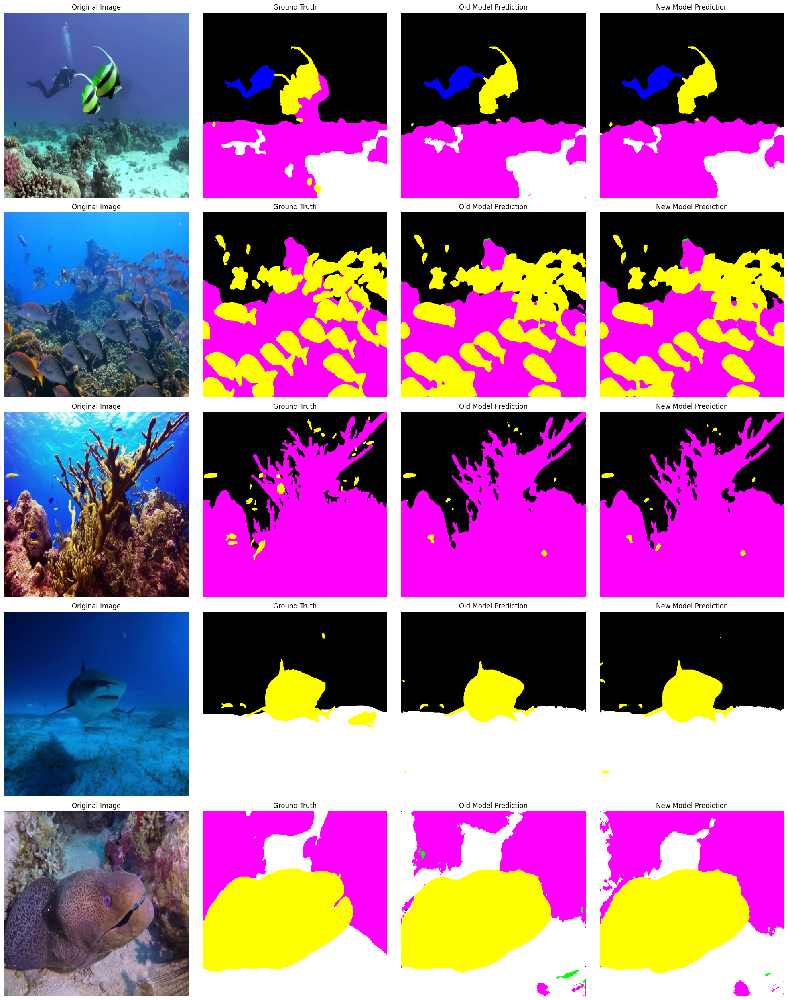

In [185]:
visualize_comparison_two_models(
    data_loader=test_loader,
    old_model=oldmodel,
    new_model=model,
    num_images=5,
)

In [186]:
def overlay_mask_on_image(image_np, mask_np, alpha=0.2):
    """Overlay color mask onto original image"""
    color_mask = decode_mask(mask_np)
    overlay = (image_np * 255).astype(np.uint8).copy()
    overlay = (overlay * (1 - alpha) + color_mask * alpha).astype(np.uint8)
    return overlay

def add_class_labels_to_overlay(overlay, mask_np, min_area=100):
    """Draw class labels on overlay image at approximate locations with white box background,
       but skip very small masks (area < min_area pixels)."""
    unique_classes = np.unique(mask_np)
    h, w, _ = overlay.shape

    for class_id in unique_classes:
        if class_id == 255:
            continue  # Skip ignore index
        class_name = CLASS_NAMES.get(class_id, f"Class {class_id}")

        # Find all pixel locations for this class
        ys, xs = np.where(mask_np == class_id)
        area = len(xs)

        if area < min_area:
            continue  # Skip small objects

        # Choose central point
        center_x = int(np.mean(xs))
        center_y = int(np.mean(ys))

        # Calculate text size
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        thickness = 1
        text_size, _ = cv2.getTextSize(class_name, font, font_scale, thickness)
        text_w, text_h = text_size

        # Draw white rectangle background
        box_coords = (
            center_x,
            center_y - text_h - 2,
            center_x + text_w + 2,
            center_y
        )
        cv2.rectangle(
            overlay,
            (box_coords[0], box_coords[1]),
            (box_coords[2], box_coords[3]),
            (255, 255, 255),
            thickness=-1
        )

        # Draw black text over white box
        cv2.putText(
            overlay,
            class_name,
            (center_x + 1, center_y - 2),
            font,
            font_scale,
            (0, 0, 0),
            thickness,
            cv2.LINE_AA
        )

    return overlay

In [187]:
def visualize_predictions_with_overlay(data_loader, model=model, device=device, num_images=5, min_area=100):
    model.eval()
    all_images = []
    all_masks = []

    # Load all images and masks
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)
    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    selected_indices = random.sample(range(total_samples), min(num_images, total_samples))

    fig, axs = plt.subplots(len(selected_indices), 4, figsize=(20, 5 * len(selected_indices)))

    if len(selected_indices) == 1:
        axs = np.expand_dims(axs, axis=0)  # Ensure 2D axs for single row

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)
            output = model(image)
            pred_mask = torch.argmax(output, dim=1).cpu().squeeze(0).numpy()

            img_np = unnormalize(all_images[idx])
            gt_mask_np = all_masks[idx].cpu().numpy()

            overlay_np = overlay_mask_on_image(img_np, pred_mask)
            overlay_np = add_class_labels_to_overlay(overlay_np, pred_mask, min_area=min_area)

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title("Original Image")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask(pred_mask))
            axs[row_idx, 2].set_title("Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(overlay_np)
            axs[row_idx, 3].set_title("Overlay + Labels")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

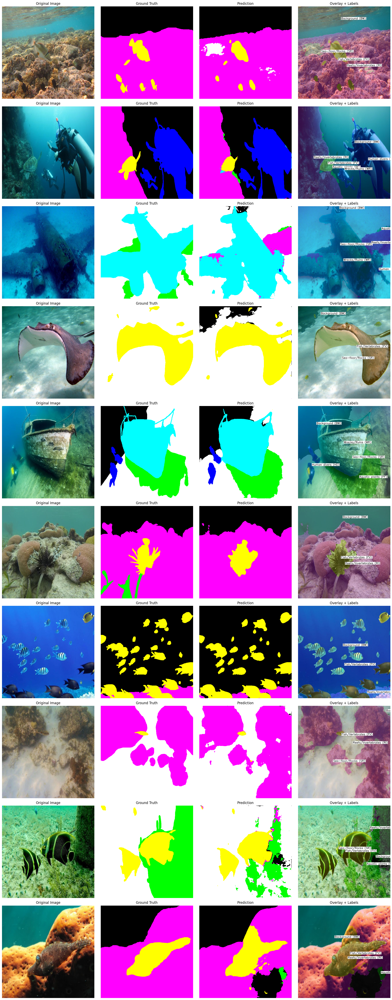

In [189]:
visualize_predictions_with_overlay(test_loader, num_images=10, min_area=100)

In [190]:
def visualize_predictions_with_range(
    data_loader,
    model=model,
    device=device,
    index_range=(0, 10),
    min_area=100
):
    """
    Visualize a specified range of images (by index) from the dataset.
    index_range: tuple (start_idx, end_idx) - will visualize images from start_idx to end_idx-1.
    """
    model.eval()
    all_images = []
    all_masks = []

    # Load full dataset from loader
    with torch.no_grad():
        for images, masks in data_loader:
            all_images.append(images)
            all_masks.append(masks)

    all_images = torch.cat(all_images, dim=0)
    all_masks = torch.cat(all_masks, dim=0)

    total_samples = all_images.shape[0]
    start_idx, end_idx = index_range

    # Validate range
    if start_idx < 0 or end_idx > total_samples or start_idx >= end_idx:
        print(f"Invalid index_range! Total samples: {total_samples}")
        return

    selected_indices = list(range(start_idx, end_idx))
    num_images = len(selected_indices)

    fig, axs = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))

    if num_images == 1:
        axs = np.expand_dims(axs, axis=0)  # Ensure 2D axs for single row case

    with torch.no_grad():
        for row_idx, idx in enumerate(selected_indices):
            image = all_images[idx].to(device).unsqueeze(0)
            output = model(image)
            pred_mask = torch.argmax(output, dim=1).cpu().squeeze(0).numpy()

            img_np = unnormalize(all_images[idx])
            gt_mask_np = all_masks[idx].cpu().numpy()

            overlay_np = overlay_mask_on_image(img_np, pred_mask)
            overlay_np = add_class_labels_to_overlay(overlay_np, pred_mask, min_area=min_area)

            axs[row_idx, 0].imshow(img_np)
            axs[row_idx, 0].set_title(f"Image idx {idx}")
            axs[row_idx, 0].axis('off')

            axs[row_idx, 1].imshow(decode_mask(gt_mask_np))
            axs[row_idx, 1].set_title("Ground Truth")
            axs[row_idx, 1].axis('off')

            axs[row_idx, 2].imshow(decode_mask(pred_mask))
            axs[row_idx, 2].set_title("Prediction")
            axs[row_idx, 2].axis('off')

            axs[row_idx, 3].imshow(overlay_np)
            axs[row_idx, 3].set_title("Overlay + Labels")
            axs[row_idx, 3].axis('off')

    plt.tight_layout()
    plt.show()

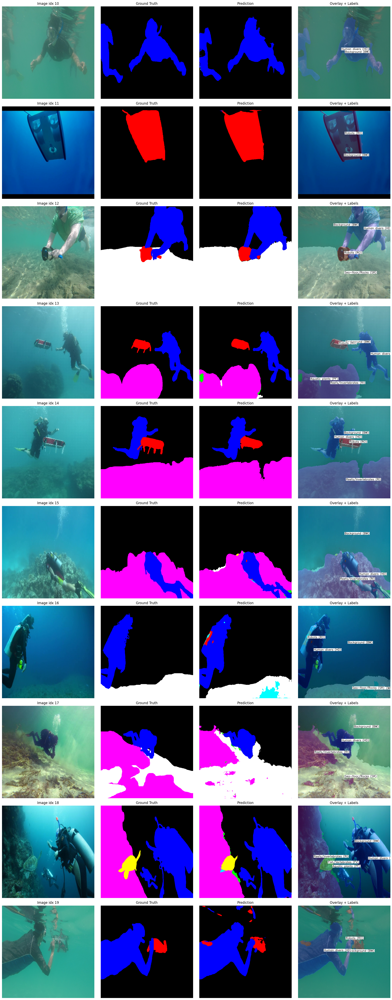

In [191]:
# Show images from index 10 to 19 (total 10 images)
visualize_predictions_with_range(
    data_loader=test_loader,
    model=model,
    device=device,
    index_range=(10, 20),
    min_area=1000
)